In [5]:
#!for a in /sys/bus/pci/devices/*; do echo 0 | sudo tee -a $a/numa_node; done
import tensorflow as tf
import matplotlib.pyplot as plt
import os
from data_processing import dataset
from models import model
from utils import tools
from plots import plots, edge_detection_plots

os.environ['TF_FORCE_GPU_ALLOW_GROWTH'] = 'true'
#np.set_printoptions(threshold=sys.maxsize)

In [6]:
config_directory = 'edge_detection_with_prior_segmentation'

config_path = os.path.join(os.getcwd(), 'configs', config_directory)
DataProcessing = dataset.DataProcessing(config_path=config_path)
Model = model.Model(config_path)
tools.parser(Model.cfg, DataProcessing.cfg)
Model.load_data(DataProcessing.cfg["NAME"])
DataProcessing.path_definitions()

# Load Dataset, Preprocess Images and Dataset

The TRAIN DS contains 1093 images.
The TEST DS contains 19 images.
The IMG_ONLY DS contains 10 images.


2022-12-31 17:13:19.018222: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:390] Filling up shuffle buffer (this may take a while): 935 of 1093
2022-12-31 17:13:20.752939: I tensorflow/core/kernels/data/shuffle_dataset_op.cc:415] Shuffle buffer filled.


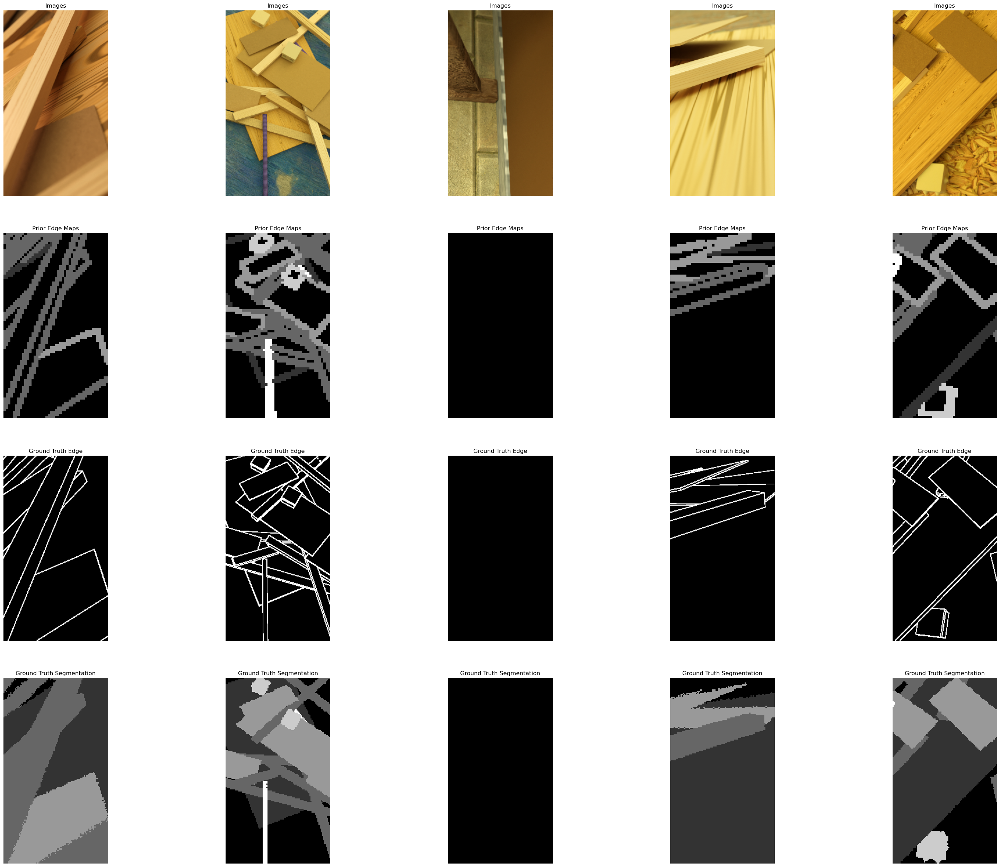

In [7]:
if Model.train_model:
    train_ds, img_count_train = DataProcessing.load_dataset(DataProcessing.key.train)
test_ds, img_count_test = DataProcessing.load_dataset(DataProcessing.key.test)

img_only_ds, img_count_img_only_ds = DataProcessing.load_dataset(DataProcessing.key.img_only)

if Model.train_model:
    for inp, out in train_ds.take(1):
        edge_detection_plots.plot_edges(images=inp['in_img'], 
                                        labels_segmentation=out['out_segmentation'],
                                        labels_edge=out['out_edge'],
                                        prior = inp['in_edge'],
                                        batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])

# Define, Compile and Train Model

In [8]:
if Model.train_model:
    model = Model.get_neural_network_model(DataProcessing.input_data_cfg, DataProcessing.output_data_cfg)
    # model.summary()

    lr = Model.get_lr(img_count_train, DataProcessing.cfg['TRAIN']['BATCH_SIZE'])
    model.compile(optimizer=tf.keras.optimizers.Adam(lr),
                  loss=Model.get_loss_function(DataProcessing.output_data_cfg),
                  metrics=Model.get_metrics(DataProcessing.output_data_cfg))

    history = model.fit(train_ds, epochs=Model.cfg["EPOCHS"], validation_data=train_ds,
                        callbacks=Model.get_callbacks(), verbose=1)

model = Model.get_best_model_from_checkpoints()

Epoch 1/100
219/219 [==============================] - 23s 88ms/step - loss: 6561.2012 - out_edge_loss: 4230.1377 - out_segmentation_loss: 2331.0652 - accuracy: 0.7893 - accuracy_edges_1: 0.9243 - f1_edges: 0.0605 - precision_edges: 0.1958 - recall_edges: 0.0413 - f1_edges_1: 0.0605 - precision_edges_1: 0.1958 - recall_edges_1: 0.0413 - accuracy_segmentation_1: 0.6944 - accuracy_segmentation_2: 0.8035 - accuracy_segmentation_3: 0.7045 - accuracy_segmentation_4: 0.8629 - accuracy_segmentation_5: 0.8815 - f1_segmentation: 0.3716 - precision_segmentation: 0.3455 - recall_segmentation: 0.4362 - f1_segmentation_1: 0.3123 - precision_segmentation_1: 0.3593 - recall_segmentation_1: 0.2947 - f1_segmentation_2: 0.6201 - precision_segmentation_2: 0.5751 - recall_segmentation_2: 0.6844 - f1_segmentation_3: 0.2741 - precision_segmentation_3: 0.2558 - recall_segmentation_3: 0.3331 - f1_segmentation_4: 0.0665 - precision_segmentation_4: 0.0449 - recall_segmentation_4: 0.1853 - f1_segmentation_5: 0.1

Epoch 5/100
219/219 [==============================] - 18s 83ms/step - loss: 3219.0425 - out_edge_loss: 2321.2268 - out_segmentation_loss: 897.8157 - accuracy: 0.9500 - accuracy_edges_1: 0.9639 - f1_edges: 0.7161 - precision_edges: 0.7043 - recall_edges: 0.7284 - f1_edges_1: 0.7161 - precision_edges_1: 0.7043 - recall_edges_1: 0.7284 - accuracy_segmentation_1: 0.8744 - accuracy_segmentation_2: 0.9463 - accuracy_segmentation_3: 0.9434 - accuracy_segmentation_4: 0.9913 - accuracy_segmentation_5: 0.9946 - f1_segmentation: 0.8062 - precision_segmentation: 0.8319 - recall_segmentation: 0.7823 - f1_segmentation_1: 0.7310 - precision_segmentation_1: 0.7626 - recall_segmentation_1: 0.7024 - f1_segmentation_2: 0.8744 - precision_segmentation_2: 0.8919 - recall_segmentation_2: 0.8576 - f1_segmentation_3: 0.8291 - precision_segmentation_3: 0.8474 - recall_segmentation_3: 0.8126 - f1_segmentation_4: 0.7465 - precision_segmentation_4: 0.8272 - recall_segmentation_4: 0.6805 - f1_segmentation_5: 0.80

Epoch 9/100
219/219 [==============================] - 18s 83ms/step - loss: 2841.6746 - out_edge_loss: 2109.4060 - out_segmentation_loss: 732.2698 - accuracy: 0.9605 - accuracy_edges_1: 0.9669 - f1_edges: 0.7441 - precision_edges: 0.7273 - recall_edges: 0.7616 - f1_edges_1: 0.7441 - precision_edges_1: 0.7273 - recall_edges_1: 0.7616 - accuracy_segmentation_1: 0.8989 - accuracy_segmentation_2: 0.9574 - accuracy_segmentation_3: 0.9586 - accuracy_segmentation_4: 0.9919 - accuracy_segmentation_5: 0.9959 - f1_segmentation: 0.8430 - precision_segmentation: 0.8698 - recall_segmentation: 0.8180 - f1_segmentation_1: 0.7709 - precision_segmentation_1: 0.8017 - recall_segmentation_1: 0.7438 - f1_segmentation_2: 0.9014 - precision_segmentation_2: 0.9150 - recall_segmentation_2: 0.8883 - f1_segmentation_3: 0.8664 - precision_segmentation_3: 0.8989 - recall_segmentation_3: 0.8364 - f1_segmentation_4: 0.8112 - precision_segmentation_4: 0.8714 - recall_segmentation_4: 0.7590 - f1_segmentation_5: 0.86

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=3896.19-epoch=10.00-f1=0.6773/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=3896.19-epoch=10.00-f1=0.6773/assets


219/219 [==============================] - 27s 126ms/step - loss: 2801.4548 - out_edge_loss: 2081.3906 - out_segmentation_loss: 720.0643 - accuracy: 0.9633 - accuracy_edges_1: 0.9674 - f1_edges: 0.7507 - precision_edges: 0.7298 - recall_edges: 0.7729 - f1_edges_1: 0.7507 - precision_edges_1: 0.7298 - recall_edges_1: 0.7729 - accuracy_segmentation_1: 0.9108 - accuracy_segmentation_2: 0.9591 - accuracy_segmentation_3: 0.9574 - accuracy_segmentation_4: 0.9932 - accuracy_segmentation_5: 0.9962 - f1_segmentation: 0.8584 - precision_segmentation: 0.8808 - recall_segmentation: 0.8372 - f1_segmentation_1: 0.8017 - precision_segmentation_1: 0.8266 - recall_segmentation_1: 0.7788 - f1_segmentation_2: 0.9034 - precision_segmentation_2: 0.9162 - recall_segmentation_2: 0.8912 - f1_segmentation_3: 0.8790 - precision_segmentation_3: 0.9050 - recall_segmentation_3: 0.8552 - f1_segmentation_4: 0.8163 - precision_segmentation_4: 0.8790 - recall_segmentation_4: 0.7619 - f1_segmentation_5: 0.8687 - precis

Epoch 14/100
219/219 [==============================] - 19s 86ms/step - loss: 2651.5791 - out_edge_loss: 1986.1653 - out_segmentation_loss: 665.4139 - accuracy: 0.9655 - accuracy_edges_1: 0.9684 - f1_edges: 0.7602 - precision_edges: 0.7390 - recall_edges: 0.7827 - f1_edges_1: 0.7602 - precision_edges_1: 0.7390 - recall_edges_1: 0.7827 - accuracy_segmentation_1: 0.9167 - accuracy_segmentation_2: 0.9643 - accuracy_segmentation_3: 0.9573 - accuracy_segmentation_4: 0.9928 - accuracy_segmentation_5: 0.9964 - f1_segmentation: 0.8668 - precision_segmentation: 0.8885 - recall_segmentation: 0.8462 - f1_segmentation_1: 0.8196 - precision_segmentation_1: 0.8476 - recall_segmentation_1: 0.7935 - f1_segmentation_2: 0.9173 - precision_segmentation_2: 0.9300 - recall_segmentation_2: 0.9050 - f1_segmentation_3: 0.8688 - precision_segmentation_3: 0.8891 - recall_segmentation_3: 0.8496 - f1_segmentation_4: 0.8399 - precision_segmentation_4: 0.8847 - recall_segmentation_4: 0.7997 - f1_segmentation_5: 0.8

Epoch 18/100
219/219 [==============================] - 18s 83ms/step - loss: 2430.7690 - out_edge_loss: 1891.0985 - out_segmentation_loss: 539.6722 - accuracy: 0.9713 - accuracy_edges_1: 0.9696 - f1_edges: 0.7690 - precision_edges: 0.7453 - recall_edges: 0.7945 - f1_edges_1: 0.7690 - precision_edges_1: 0.7453 - recall_edges_1: 0.7945 - accuracy_segmentation_1: 0.9290 - accuracy_segmentation_2: 0.9691 - accuracy_segmentation_3: 0.9673 - accuracy_segmentation_4: 0.9939 - accuracy_segmentation_5: 0.9971 - f1_segmentation: 0.8912 - precision_segmentation: 0.8995 - recall_segmentation: 0.8832 - f1_segmentation_1: 0.8476 - precision_segmentation_1: 0.8529 - recall_segmentation_1: 0.8430 - f1_segmentation_2: 0.9297 - precision_segmentation_2: 0.9373 - recall_segmentation_2: 0.9224 - f1_segmentation_3: 0.9027 - precision_segmentation_3: 0.9109 - recall_segmentation_3: 0.8947 - f1_segmentation_4: 0.8688 - precision_segmentation_4: 0.9022 - recall_segmentation_4: 0.8379 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=2454.13-epoch=20.00-f1=0.7680/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=2454.13-epoch=20.00-f1=0.7680/assets


219/219 [==============================] - 27s 123ms/step - loss: 2394.2761 - out_edge_loss: 1870.0952 - out_segmentation_loss: 524.1818 - accuracy: 0.9719 - accuracy_edges_1: 0.9702 - f1_edges: 0.7725 - precision_edges: 0.7492 - recall_edges: 0.7974 - f1_edges_1: 0.7725 - precision_edges_1: 0.7492 - recall_edges_1: 0.7974 - accuracy_segmentation_1: 0.9330 - accuracy_segmentation_2: 0.9677 - accuracy_segmentation_3: 0.9685 - accuracy_segmentation_4: 0.9936 - accuracy_segmentation_5: 0.9967 - f1_segmentation: 0.8902 - precision_segmentation: 0.9029 - recall_segmentation: 0.8779 - f1_segmentation_1: 0.8514 - precision_segmentation_1: 0.8698 - recall_segmentation_1: 0.8338 - f1_segmentation_2: 0.9259 - precision_segmentation_2: 0.9320 - recall_segmentation_2: 0.9198 - f1_segmentation_3: 0.8992 - precision_segmentation_3: 0.9083 - recall_segmentation_3: 0.8908 - f1_segmentation_4: 0.8619 - precision_segmentation_4: 0.8856 - recall_segmentation_4: 0.8401 - f1_segmentation_5: 0.8943 - precis

Epoch 24/100
219/219 [==============================] - 18s 83ms/step - loss: 2351.0010 - out_edge_loss: 1833.1370 - out_segmentation_loss: 517.8633 - accuracy: 0.9731 - accuracy_edges_1: 0.9712 - f1_edges: 0.7793 - precision_edges: 0.7579 - recall_edges: 0.8021 - f1_edges_1: 0.7793 - precision_edges_1: 0.7579 - recall_edges_1: 0.8021 - accuracy_segmentation_1: 0.9314 - accuracy_segmentation_2: 0.9711 - accuracy_segmentation_3: 0.9721 - accuracy_segmentation_4: 0.9940 - accuracy_segmentation_5: 0.9970 - f1_segmentation: 0.8989 - precision_segmentation: 0.9112 - recall_segmentation: 0.8870 - f1_segmentation_1: 0.8602 - precision_segmentation_1: 0.8738 - recall_segmentation_1: 0.8474 - f1_segmentation_2: 0.9323 - precision_segmentation_2: 0.9398 - recall_segmentation_2: 0.9249 - f1_segmentation_3: 0.9165 - precision_segmentation_3: 0.9283 - recall_segmentation_3: 0.9051 - f1_segmentation_4: 0.8628 - precision_segmentation_4: 0.9047 - recall_segmentation_4: 0.8251 - f1_segmentation_5: 0.9

Epoch 28/100
219/219 [==============================] - 18s 83ms/step - loss: 2284.7688 - out_edge_loss: 1795.1244 - out_segmentation_loss: 489.6453 - accuracy: 0.9743 - accuracy_edges_1: 0.9717 - f1_edges: 0.7857 - precision_edges: 0.7652 - recall_edges: 0.8076 - f1_edges_1: 0.7857 - precision_edges_1: 0.7652 - recall_edges_1: 0.8076 - accuracy_segmentation_1: 0.9413 - accuracy_segmentation_2: 0.9718 - accuracy_segmentation_3: 0.9673 - accuracy_segmentation_4: 0.9941 - accuracy_segmentation_5: 0.9972 - f1_segmentation: 0.9014 - precision_segmentation: 0.9170 - recall_segmentation: 0.8865 - f1_segmentation_1: 0.8650 - precision_segmentation_1: 0.8837 - recall_segmentation_1: 0.8476 - f1_segmentation_2: 0.9337 - precision_segmentation_2: 0.9415 - recall_segmentation_2: 0.9261 - f1_segmentation_3: 0.9093 - precision_segmentation_3: 0.9258 - recall_segmentation_3: 0.8937 - f1_segmentation_4: 0.8738 - precision_segmentation_4: 0.9099 - recall_segmentation_4: 0.8405 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=2348.67-epoch=30.00-f1=0.7889/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=2348.67-epoch=30.00-f1=0.7889/assets


219/219 [==============================] - 28s 127ms/step - loss: 2222.7043 - out_edge_loss: 1775.9318 - out_segmentation_loss: 446.7733 - accuracy: 0.9766 - accuracy_edges_1: 0.9715 - f1_edges: 0.7859 - precision_edges: 0.7594 - recall_edges: 0.8143 - f1_edges_1: 0.7859 - precision_edges_1: 0.7594 - recall_edges_1: 0.8143 - accuracy_segmentation_1: 0.9428 - accuracy_segmentation_2: 0.9728 - accuracy_segmentation_3: 0.9757 - accuracy_segmentation_4: 0.9944 - accuracy_segmentation_5: 0.9972 - f1_segmentation: 0.9104 - precision_segmentation: 0.9174 - recall_segmentation: 0.9037 - f1_segmentation_1: 0.8746 - precision_segmentation_1: 0.8798 - recall_segmentation_1: 0.8707 - f1_segmentation_2: 0.9390 - precision_segmentation_2: 0.9446 - recall_segmentation_2: 0.9335 - f1_segmentation_3: 0.9252 - precision_segmentation_3: 0.9340 - recall_segmentation_3: 0.9165 - f1_segmentation_4: 0.8762 - precision_segmentation_4: 0.8920 - recall_segmentation_4: 0.8625 - f1_segmentation_5: 0.9084 - precis

Epoch 34/100
219/219 [==============================] - 18s 83ms/step - loss: 2202.9873 - out_edge_loss: 1759.8597 - out_segmentation_loss: 443.1276 - accuracy: 0.9764 - accuracy_edges_1: 0.9720 - f1_edges: 0.7863 - precision_edges: 0.7628 - recall_edges: 0.8115 - f1_edges_1: 0.7863 - precision_edges_1: 0.7628 - recall_edges_1: 0.8115 - accuracy_segmentation_1: 0.9460 - accuracy_segmentation_2: 0.9712 - accuracy_segmentation_3: 0.9729 - accuracy_segmentation_4: 0.9946 - accuracy_segmentation_5: 0.9974 - f1_segmentation: 0.9115 - precision_segmentation: 0.9213 - recall_segmentation: 0.9019 - f1_segmentation_1: 0.8876 - precision_segmentation_1: 0.8977 - recall_segmentation_1: 0.8778 - f1_segmentation_2: 0.9340 - precision_segmentation_2: 0.9416 - recall_segmentation_2: 0.9267 - f1_segmentation_3: 0.9196 - precision_segmentation_3: 0.9265 - recall_segmentation_3: 0.9129 - f1_segmentation_4: 0.8789 - precision_segmentation_4: 0.9173 - recall_segmentation_4: 0.8441 - f1_segmentation_5: 0.9

Epoch 38/100
219/219 [==============================] - 18s 83ms/step - loss: 2107.4700 - out_edge_loss: 1714.2457 - out_segmentation_loss: 393.2245 - accuracy: 0.9809 - accuracy_edges_1: 0.9735 - f1_edges: 0.7976 - precision_edges: 0.7723 - recall_edges: 0.8246 - f1_edges_1: 0.7976 - precision_edges_1: 0.7723 - recall_edges_1: 0.8246 - accuracy_segmentation_1: 0.9578 - accuracy_segmentation_2: 0.9763 - accuracy_segmentation_3: 0.9769 - accuracy_segmentation_4: 0.9958 - accuracy_segmentation_5: 0.9976 - f1_segmentation: 0.9275 - precision_segmentation: 0.9367 - recall_segmentation: 0.9185 - f1_segmentation_1: 0.9135 - precision_segmentation_1: 0.9222 - recall_segmentation_1: 0.9049 - f1_segmentation_2: 0.9434 - precision_segmentation_2: 0.9480 - recall_segmentation_2: 0.9388 - f1_segmentation_3: 0.9323 - precision_segmentation_3: 0.9456 - recall_segmentation_3: 0.9194 - f1_segmentation_4: 0.8919 - precision_segmentation_4: 0.9134 - recall_segmentation_4: 0.8720 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=2097.69-epoch=40.00-f1=0.7902/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=2097.69-epoch=40.00-f1=0.7902/assets


219/219 [==============================] - 28s 127ms/step - loss: 2105.8596 - out_edge_loss: 1713.5430 - out_segmentation_loss: 392.3168 - accuracy: 0.9794 - accuracy_edges_1: 0.9736 - f1_edges: 0.7974 - precision_edges: 0.7718 - recall_edges: 0.8246 - f1_edges_1: 0.7974 - precision_edges_1: 0.7718 - recall_edges_1: 0.8246 - accuracy_segmentation_1: 0.9486 - accuracy_segmentation_2: 0.9758 - accuracy_segmentation_3: 0.9797 - accuracy_segmentation_4: 0.9955 - accuracy_segmentation_5: 0.9972 - f1_segmentation: 0.9198 - precision_segmentation: 0.9315 - recall_segmentation: 0.9086 - f1_segmentation_1: 0.8907 - precision_segmentation_1: 0.9080 - recall_segmentation_1: 0.8745 - f1_segmentation_2: 0.9421 - precision_segmentation_2: 0.9451 - recall_segmentation_2: 0.9392 - f1_segmentation_3: 0.9367 - precision_segmentation_3: 0.9467 - recall_segmentation_3: 0.9272 - f1_segmentation_4: 0.9003 - precision_segmentation_4: 0.9288 - recall_segmentation_4: 0.8736 - f1_segmentation_5: 0.9150 - precis

Epoch 44/100
219/219 [==============================] - 18s 84ms/step - loss: 2022.0011 - out_edge_loss: 1688.5211 - out_segmentation_loss: 333.4796 - accuracy: 0.9829 - accuracy_edges_1: 0.9723 - f1_edges: 0.7969 - precision_edges: 0.7704 - recall_edges: 0.8254 - f1_edges_1: 0.7969 - precision_edges_1: 0.7704 - recall_edges_1: 0.8254 - accuracy_segmentation_1: 0.9621 - accuracy_segmentation_2: 0.9764 - accuracy_segmentation_3: 0.9824 - accuracy_segmentation_4: 0.9960 - accuracy_segmentation_5: 0.9974 - f1_segmentation: 0.9371 - precision_segmentation: 0.9434 - recall_segmentation: 0.9309 - f1_segmentation_1: 0.9229 - precision_segmentation_1: 0.9307 - recall_segmentation_1: 0.9152 - f1_segmentation_2: 0.9468 - precision_segmentation_2: 0.9512 - recall_segmentation_2: 0.9423 - f1_segmentation_3: 0.9493 - precision_segmentation_3: 0.9539 - recall_segmentation_3: 0.9447 - f1_segmentation_4: 0.9092 - precision_segmentation_4: 0.9256 - recall_segmentation_4: 0.8937 - f1_segmentation_5: 0.9

Epoch 48/100
219/219 [==============================] - 18s 84ms/step - loss: 2017.2782 - out_edge_loss: 1673.1516 - out_segmentation_loss: 344.1260 - accuracy: 0.9834 - accuracy_edges_1: 0.9740 - f1_edges: 0.7999 - precision_edges: 0.7722 - recall_edges: 0.8297 - f1_edges_1: 0.7999 - precision_edges_1: 0.7722 - recall_edges_1: 0.8297 - accuracy_segmentation_1: 0.9626 - accuracy_segmentation_2: 0.9772 - accuracy_segmentation_3: 0.9832 - accuracy_segmentation_4: 0.9966 - accuracy_segmentation_5: 0.9975 - f1_segmentation: 0.9358 - precision_segmentation: 0.9420 - recall_segmentation: 0.9298 - f1_segmentation_1: 0.9216 - precision_segmentation_1: 0.9273 - recall_segmentation_1: 0.9160 - f1_segmentation_2: 0.9466 - precision_segmentation_2: 0.9502 - recall_segmentation_2: 0.9431 - f1_segmentation_3: 0.9471 - precision_segmentation_3: 0.9562 - recall_segmentation_3: 0.9383 - f1_segmentation_4: 0.9136 - precision_segmentation_4: 0.9306 - recall_segmentation_4: 0.8974 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=2160.18-epoch=50.00-f1=0.7855/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=2160.18-epoch=50.00-f1=0.7855/assets


219/219 [==============================] - 28s 126ms/step - loss: 1999.4089 - out_edge_loss: 1669.6221 - out_segmentation_loss: 329.7867 - accuracy: 0.9837 - accuracy_edges_1: 0.9740 - f1_edges: 0.7989 - precision_edges: 0.7734 - recall_edges: 0.8262 - f1_edges_1: 0.7989 - precision_edges_1: 0.7734 - recall_edges_1: 0.8262 - accuracy_segmentation_1: 0.9663 - accuracy_segmentation_2: 0.9776 - accuracy_segmentation_3: 0.9807 - accuracy_segmentation_4: 0.9964 - accuracy_segmentation_5: 0.9977 - f1_segmentation: 0.9383 - precision_segmentation: 0.9462 - recall_segmentation: 0.9305 - f1_segmentation_1: 0.9305 - precision_segmentation_1: 0.9379 - recall_segmentation_1: 0.9232 - f1_segmentation_2: 0.9488 - precision_segmentation_2: 0.9537 - recall_segmentation_2: 0.9440 - f1_segmentation_3: 0.9396 - precision_segmentation_3: 0.9504 - recall_segmentation_3: 0.9290 - f1_segmentation_4: 0.9127 - precision_segmentation_4: 0.9327 - recall_segmentation_4: 0.8935 - f1_segmentation_5: 0.9291 - precis

Epoch 54/100
219/219 [==============================] - 18s 83ms/step - loss: 1977.2919 - out_edge_loss: 1647.8390 - out_segmentation_loss: 329.4529 - accuracy: 0.9830 - accuracy_edges_1: 0.9731 - f1_edges: 0.8029 - precision_edges: 0.7754 - recall_edges: 0.8325 - f1_edges_1: 0.8029 - precision_edges_1: 0.7754 - recall_edges_1: 0.8325 - accuracy_segmentation_1: 0.9595 - accuracy_segmentation_2: 0.9780 - accuracy_segmentation_3: 0.9831 - accuracy_segmentation_4: 0.9965 - accuracy_segmentation_5: 0.9980 - f1_segmentation: 0.9356 - precision_segmentation: 0.9424 - recall_segmentation: 0.9290 - f1_segmentation_1: 0.9140 - precision_segmentation_1: 0.9183 - recall_segmentation_1: 0.9101 - f1_segmentation_2: 0.9496 - precision_segmentation_2: 0.9544 - recall_segmentation_2: 0.9449 - f1_segmentation_3: 0.9491 - precision_segmentation_3: 0.9594 - recall_segmentation_3: 0.9391 - f1_segmentation_4: 0.9198 - precision_segmentation_4: 0.9377 - recall_segmentation_4: 0.9026 - f1_segmentation_5: 0.9

Epoch 58/100
219/219 [==============================] - 18s 83ms/step - loss: 1913.8979 - out_edge_loss: 1629.0597 - out_segmentation_loss: 284.8392 - accuracy: 0.9865 - accuracy_edges_1: 0.9747 - f1_edges: 0.8076 - precision_edges: 0.7783 - recall_edges: 0.8392 - f1_edges_1: 0.8076 - precision_edges_1: 0.7783 - recall_edges_1: 0.8392 - accuracy_segmentation_1: 0.9722 - accuracy_segmentation_2: 0.9805 - accuracy_segmentation_3: 0.9849 - accuracy_segmentation_4: 0.9968 - accuracy_segmentation_5: 0.9980 - f1_segmentation: 0.9485 - precision_segmentation: 0.9544 - recall_segmentation: 0.9427 - f1_segmentation_1: 0.9402 - precision_segmentation_1: 0.9481 - recall_segmentation_1: 0.9325 - f1_segmentation_2: 0.9539 - precision_segmentation_2: 0.9561 - recall_segmentation_2: 0.9517 - f1_segmentation_3: 0.9571 - precision_segmentation_3: 0.9631 - recall_segmentation_3: 0.9513 - f1_segmentation_4: 0.9185 - precision_segmentation_4: 0.9367 - recall_segmentation_4: 0.9010 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1912.12-epoch=60.00-f1=0.8008/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1912.12-epoch=60.00-f1=0.8008/assets


219/219 [==============================] - 28s 127ms/step - loss: 1912.6538 - out_edge_loss: 1635.6978 - out_segmentation_loss: 276.9548 - accuracy: 0.9858 - accuracy_edges_1: 0.9752 - f1_edges: 0.8051 - precision_edges: 0.7793 - recall_edges: 0.8327 - f1_edges_1: 0.8051 - precision_edges_1: 0.7793 - recall_edges_1: 0.8327 - accuracy_segmentation_1: 0.9730 - accuracy_segmentation_2: 0.9788 - accuracy_segmentation_3: 0.9839 - accuracy_segmentation_4: 0.9958 - accuracy_segmentation_5: 0.9978 - f1_segmentation: 0.9450 - precision_segmentation: 0.9495 - recall_segmentation: 0.9406 - f1_segmentation_1: 0.9421 - precision_segmentation_1: 0.9451 - recall_segmentation_1: 0.9392 - f1_segmentation_2: 0.9496 - precision_segmentation_2: 0.9530 - recall_segmentation_2: 0.9463 - f1_segmentation_3: 0.9506 - precision_segmentation_3: 0.9570 - recall_segmentation_3: 0.9443 - f1_segmentation_4: 0.8921 - precision_segmentation_4: 0.9042 - recall_segmentation_4: 0.8818 - f1_segmentation_5: 0.9310 - precis

Epoch 64/100
219/219 [==============================] - 18s 83ms/step - loss: 1895.9072 - out_edge_loss: 1620.4846 - out_segmentation_loss: 275.4228 - accuracy: 0.9865 - accuracy_edges_1: 0.9746 - f1_edges: 0.8060 - precision_edges: 0.7777 - recall_edges: 0.8363 - f1_edges_1: 0.8060 - precision_edges_1: 0.7777 - recall_edges_1: 0.8363 - accuracy_segmentation_1: 0.9720 - accuracy_segmentation_2: 0.9803 - accuracy_segmentation_3: 0.9852 - accuracy_segmentation_4: 0.9971 - accuracy_segmentation_5: 0.9979 - f1_segmentation: 0.9481 - precision_segmentation: 0.9539 - recall_segmentation: 0.9424 - f1_segmentation_1: 0.9420 - precision_segmentation_1: 0.9492 - recall_segmentation_1: 0.9352 - f1_segmentation_2: 0.9545 - precision_segmentation_2: 0.9562 - recall_segmentation_2: 0.9528 - f1_segmentation_3: 0.9534 - precision_segmentation_3: 0.9603 - recall_segmentation_3: 0.9466 - f1_segmentation_4: 0.9240 - precision_segmentation_4: 0.9391 - recall_segmentation_4: 0.9094 - f1_segmentation_5: 0.9

Epoch 68/100
219/219 [==============================] - 18s 83ms/step - loss: 1921.9623 - out_edge_loss: 1621.9807 - out_segmentation_loss: 299.9816 - accuracy: 0.9843 - accuracy_edges_1: 0.9746 - f1_edges: 0.8078 - precision_edges: 0.7803 - recall_edges: 0.8372 - f1_edges_1: 0.8078 - precision_edges_1: 0.7803 - recall_edges_1: 0.8372 - accuracy_segmentation_1: 0.9713 - accuracy_segmentation_2: 0.9764 - accuracy_segmentation_3: 0.9795 - accuracy_segmentation_4: 0.9966 - accuracy_segmentation_5: 0.9975 - f1_segmentation: 0.9407 - precision_segmentation: 0.9481 - recall_segmentation: 0.9335 - f1_segmentation_1: 0.9398 - precision_segmentation_1: 0.9422 - recall_segmentation_1: 0.9374 - f1_segmentation_2: 0.9453 - precision_segmentation_2: 0.9529 - recall_segmentation_2: 0.9380 - f1_segmentation_3: 0.9402 - precision_segmentation_3: 0.9529 - recall_segmentation_3: 0.9280 - f1_segmentation_4: 0.9201 - precision_segmentation_4: 0.9366 - recall_segmentation_4: 0.9042 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1796.24-epoch=70.00-f1=0.8114/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1796.24-epoch=70.00-f1=0.8114/assets


219/219 [==============================] - 27s 125ms/step - loss: 1846.9696 - out_edge_loss: 1595.7272 - out_segmentation_loss: 251.2420 - accuracy: 0.9870 - accuracy_edges_1: 0.9756 - f1_edges: 0.8119 - precision_edges: 0.7830 - recall_edges: 0.8430 - f1_edges_1: 0.8119 - precision_edges_1: 0.7830 - recall_edges_1: 0.8430 - accuracy_segmentation_1: 0.9744 - accuracy_segmentation_2: 0.9815 - accuracy_segmentation_3: 0.9838 - accuracy_segmentation_4: 0.9973 - accuracy_segmentation_5: 0.9980 - f1_segmentation: 0.9514 - precision_segmentation: 0.9557 - recall_segmentation: 0.9472 - f1_segmentation_1: 0.9472 - precision_segmentation_1: 0.9498 - recall_segmentation_1: 0.9446 - f1_segmentation_2: 0.9565 - precision_segmentation_2: 0.9597 - recall_segmentation_2: 0.9533 - f1_segmentation_3: 0.9546 - precision_segmentation_3: 0.9599 - recall_segmentation_3: 0.9495 - f1_segmentation_4: 0.9310 - precision_segmentation_4: 0.9476 - recall_segmentation_4: 0.9149 - f1_segmentation_5: 0.9377 - precis

Epoch 74/100
219/219 [==============================] - 18s 84ms/step - loss: 1849.5560 - out_edge_loss: 1590.4994 - out_segmentation_loss: 259.0561 - accuracy: 0.9860 - accuracy_edges_1: 0.9748 - f1_edges: 0.8058 - precision_edges: 0.7769 - recall_edges: 0.8369 - f1_edges_1: 0.8058 - precision_edges_1: 0.7769 - recall_edges_1: 0.8369 - accuracy_segmentation_1: 0.9719 - accuracy_segmentation_2: 0.9803 - accuracy_segmentation_3: 0.9833 - accuracy_segmentation_4: 0.9971 - accuracy_segmentation_5: 0.9977 - f1_segmentation: 0.9466 - precision_segmentation: 0.9499 - recall_segmentation: 0.9433 - f1_segmentation_1: 0.9391 - precision_segmentation_1: 0.9432 - recall_segmentation_1: 0.9351 - f1_segmentation_2: 0.9552 - precision_segmentation_2: 0.9581 - recall_segmentation_2: 0.9523 - f1_segmentation_3: 0.9489 - precision_segmentation_3: 0.9500 - recall_segmentation_3: 0.9481 - f1_segmentation_4: 0.9322 - precision_segmentation_4: 0.9428 - recall_segmentation_4: 0.9220 - f1_segmentation_5: 0.9

Epoch 78/100
219/219 [==============================] - 18s 83ms/step - loss: 1824.2366 - out_edge_loss: 1583.6505 - out_segmentation_loss: 240.5863 - accuracy: 0.9882 - accuracy_edges_1: 0.9746 - f1_edges: 0.8101 - precision_edges: 0.7826 - recall_edges: 0.8395 - f1_edges_1: 0.8101 - precision_edges_1: 0.7826 - recall_edges_1: 0.8395 - accuracy_segmentation_1: 0.9760 - accuracy_segmentation_2: 0.9813 - accuracy_segmentation_3: 0.9882 - accuracy_segmentation_4: 0.9972 - accuracy_segmentation_5: 0.9982 - f1_segmentation: 0.9547 - precision_segmentation: 0.9590 - recall_segmentation: 0.9503 - f1_segmentation_1: 0.9462 - precision_segmentation_1: 0.9469 - recall_segmentation_1: 0.9457 - f1_segmentation_2: 0.9583 - precision_segmentation_2: 0.9613 - recall_segmentation_2: 0.9554 - f1_segmentation_3: 0.9649 - precision_segmentation_3: 0.9747 - recall_segmentation_3: 0.9553 - f1_segmentation_4: 0.9320 - precision_segmentation_4: 0.9447 - recall_segmentation_4: 0.9196 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1803.89-epoch=80.00-f1=0.8077/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1803.89-epoch=80.00-f1=0.8077/assets


219/219 [==============================] - 27s 125ms/step - loss: 1816.6838 - out_edge_loss: 1580.1344 - out_segmentation_loss: 236.5493 - accuracy: 0.9883 - accuracy_edges_1: 0.9753 - f1_edges: 0.8130 - precision_edges: 0.7857 - recall_edges: 0.8423 - f1_edges_1: 0.8130 - precision_edges_1: 0.7857 - recall_edges_1: 0.8423 - accuracy_segmentation_1: 0.9768 - accuracy_segmentation_2: 0.9817 - accuracy_segmentation_3: 0.9881 - accuracy_segmentation_4: 0.9971 - accuracy_segmentation_5: 0.9978 - f1_segmentation: 0.9560 - precision_segmentation: 0.9626 - recall_segmentation: 0.9495 - f1_segmentation_1: 0.9511 - precision_segmentation_1: 0.9578 - recall_segmentation_1: 0.9445 - f1_segmentation_2: 0.9577 - precision_segmentation_2: 0.9612 - recall_segmentation_2: 0.9543 - f1_segmentation_3: 0.9655 - precision_segmentation_3: 0.9742 - recall_segmentation_3: 0.9570 - f1_segmentation_4: 0.9310 - precision_segmentation_4: 0.9443 - recall_segmentation_4: 0.9181 - f1_segmentation_5: 0.9328 - precis

Epoch 84/100
219/219 [==============================] - 18s 83ms/step - loss: 1791.0216 - out_edge_loss: 1568.8201 - out_segmentation_loss: 222.2020 - accuracy: 0.9889 - accuracy_edges_1: 0.9748 - f1_edges: 0.8137 - precision_edges: 0.7863 - recall_edges: 0.8431 - f1_edges_1: 0.8137 - precision_edges_1: 0.7863 - recall_edges_1: 0.8431 - accuracy_segmentation_1: 0.9788 - accuracy_segmentation_2: 0.9817 - accuracy_segmentation_3: 0.9886 - accuracy_segmentation_4: 0.9973 - accuracy_segmentation_5: 0.9981 - f1_segmentation: 0.9585 - precision_segmentation: 0.9633 - recall_segmentation: 0.9537 - f1_segmentation_1: 0.9558 - precision_segmentation_1: 0.9583 - recall_segmentation_1: 0.9532 - f1_segmentation_2: 0.9596 - precision_segmentation_2: 0.9621 - recall_segmentation_2: 0.9572 - f1_segmentation_3: 0.9656 - precision_segmentation_3: 0.9751 - recall_segmentation_3: 0.9563 - f1_segmentation_4: 0.9299 - precision_segmentation_4: 0.9488 - recall_segmentation_4: 0.9119 - f1_segmentation_5: 0.9

Epoch 88/100
219/219 [==============================] - 18s 83ms/step - loss: 1780.5707 - out_edge_loss: 1561.3057 - out_segmentation_loss: 219.2661 - accuracy: 0.9893 - accuracy_edges_1: 0.9757 - f1_edges: 0.8126 - precision_edges: 0.7843 - recall_edges: 0.8430 - f1_edges_1: 0.8126 - precision_edges_1: 0.7843 - recall_edges_1: 0.8430 - accuracy_segmentation_1: 0.9791 - accuracy_segmentation_2: 0.9826 - accuracy_segmentation_3: 0.9893 - accuracy_segmentation_4: 0.9973 - accuracy_segmentation_5: 0.9981 - f1_segmentation: 0.9584 - precision_segmentation: 0.9627 - recall_segmentation: 0.9542 - f1_segmentation_1: 0.9553 - precision_segmentation_1: 0.9583 - recall_segmentation_1: 0.9524 - f1_segmentation_2: 0.9592 - precision_segmentation_2: 0.9616 - recall_segmentation_2: 0.9567 - f1_segmentation_3: 0.9667 - precision_segmentation_3: 0.9735 - recall_segmentation_3: 0.9601 - f1_segmentation_4: 0.9356 - precision_segmentation_4: 0.9485 - recall_segmentation_4: 0.9231 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1724.58-epoch=90.00-f1=0.8177/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1724.58-epoch=90.00-f1=0.8177/assets


219/219 [==============================] - 27s 125ms/step - loss: 1773.4478 - out_edge_loss: 1556.2085 - out_segmentation_loss: 217.2388 - accuracy: 0.9887 - accuracy_edges_1: 0.9753 - f1_edges: 0.8107 - precision_edges: 0.7825 - recall_edges: 0.8412 - f1_edges_1: 0.8107 - precision_edges_1: 0.7825 - recall_edges_1: 0.8412 - accuracy_segmentation_1: 0.9786 - accuracy_segmentation_2: 0.9818 - accuracy_segmentation_3: 0.9882 - accuracy_segmentation_4: 0.9970 - accuracy_segmentation_5: 0.9981 - f1_segmentation: 0.9568 - precision_segmentation: 0.9613 - recall_segmentation: 0.9524 - f1_segmentation_1: 0.9552 - precision_segmentation_1: 0.9597 - recall_segmentation_1: 0.9508 - f1_segmentation_2: 0.9576 - precision_segmentation_2: 0.9582 - recall_segmentation_2: 0.9571 - f1_segmentation_3: 0.9629 - precision_segmentation_3: 0.9712 - recall_segmentation_3: 0.9548 - f1_segmentation_4: 0.9349 - precision_segmentation_4: 0.9440 - recall_segmentation_4: 0.9264 - f1_segmentation_5: 0.9383 - precis

Epoch 94/100
219/219 [==============================] - 18s 83ms/step - loss: 1747.8438 - out_edge_loss: 1543.6854 - out_segmentation_loss: 204.1582 - accuracy: 0.9893 - accuracy_edges_1: 0.9747 - f1_edges: 0.8121 - precision_edges: 0.7826 - recall_edges: 0.8439 - f1_edges_1: 0.8121 - precision_edges_1: 0.7826 - recall_edges_1: 0.8439 - accuracy_segmentation_1: 0.9803 - accuracy_segmentation_2: 0.9820 - accuracy_segmentation_3: 0.9889 - accuracy_segmentation_4: 0.9973 - accuracy_segmentation_5: 0.9979 - f1_segmentation: 0.9606 - precision_segmentation: 0.9652 - recall_segmentation: 0.9560 - f1_segmentation_1: 0.9597 - precision_segmentation_1: 0.9651 - recall_segmentation_1: 0.9544 - f1_segmentation_2: 0.9599 - precision_segmentation_2: 0.9615 - recall_segmentation_2: 0.9583 - f1_segmentation_3: 0.9677 - precision_segmentation_3: 0.9740 - recall_segmentation_3: 0.9616 - f1_segmentation_4: 0.9372 - precision_segmentation_4: 0.9477 - recall_segmentation_4: 0.9269 - f1_segmentation_5: 0.9

Epoch 98/100
219/219 [==============================] - 18s 84ms/step - loss: 1742.1796 - out_edge_loss: 1542.4412 - out_segmentation_loss: 199.7387 - accuracy: 0.9899 - accuracy_edges_1: 0.9762 - f1_edges: 0.8148 - precision_edges: 0.7854 - recall_edges: 0.8465 - f1_edges_1: 0.8148 - precision_edges_1: 0.7854 - recall_edges_1: 0.8465 - accuracy_segmentation_1: 0.9804 - accuracy_segmentation_2: 0.9839 - accuracy_segmentation_3: 0.9894 - accuracy_segmentation_4: 0.9976 - accuracy_segmentation_5: 0.9982 - f1_segmentation: 0.9600 - precision_segmentation: 0.9643 - recall_segmentation: 0.9558 - f1_segmentation_1: 0.9570 - precision_segmentation_1: 0.9612 - recall_segmentation_1: 0.9529 - f1_segmentation_2: 0.9606 - precision_segmentation_2: 0.9616 - recall_segmentation_2: 0.9597 - f1_segmentation_3: 0.9675 - precision_segmentation_3: 0.9747 - recall_segmentation_3: 0.9604 - f1_segmentation_4: 0.9416 - precision_segmentation_4: 0.9523 - recall_segmentation_4: 0.9312 - f1_segmentation_5: 0.9

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1700.11-epoch=100.00-f1=0.8199/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/CKPT/ckpt-loss=1700.11-epoch=100.00-f1=0.8199/assets


219/219 [==============================] - 28s 128ms/step - loss: 1741.8092 - out_edge_loss: 1537.2642 - out_segmentation_loss: 204.5448 - accuracy: 0.9898 - accuracy_edges_1: 0.9756 - f1_edges: 0.8142 - precision_edges: 0.7855 - recall_edges: 0.8451 - f1_edges_1: 0.8142 - precision_edges_1: 0.7855 - recall_edges_1: 0.8451 - accuracy_segmentation_1: 0.9796 - accuracy_segmentation_2: 0.9833 - accuracy_segmentation_3: 0.9904 - accuracy_segmentation_4: 0.9974 - accuracy_segmentation_5: 0.9981 - f1_segmentation: 0.9614 - precision_segmentation: 0.9652 - recall_segmentation: 0.9577 - f1_segmentation_1: 0.9562 - precision_segmentation_1: 0.9572 - recall_segmentation_1: 0.9553 - f1_segmentation_2: 0.9613 - precision_segmentation_2: 0.9646 - recall_segmentation_2: 0.9580 - f1_segmentation_3: 0.9728 - precision_segmentation_3: 0.9787 - recall_segmentation_3: 0.9671 - f1_segmentation_4: 0.9411 - precision_segmentation_4: 0.9574 - recall_segmentation_4: 0.9253 - f1_segmentation_5: 0.9395 - precis

INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/TFLITE/assets


INFO:tensorflow:Assets written to: /home/david/SemesterProject/Models/edge_detection/edge_detection_with_prior_segmentation/TFLITE/assets


In [9]:
model.summary()


tf.keras.utils.plot_model(
    model,
    to_file=Model.Data.paths['FIGURES']+"/model.png",
    show_shapes=True,
    show_dtype=False,
    show_layer_names=True,
    rankdir='TB',
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=True
)

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 in_img (InputLayer)            [(None, 320, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_25 (Conv2D)             (None, 160, 90, 8)   224         ['in_img[0][0]']                 
                                                                                                  
 batch_normalization_51 (BatchN  (None, 160, 90, 8)  32          ['conv2d_25[0][0]']              
 ormalization)                                                                                    
                                                                                            

 in_edge (InputLayer)           [(None, 80, 45, 5)]  0           []                               
                                                                                                  
 depthwise_conv2d_12 (Depthwise  (None, 80, 45, 96)  960         ['batch_normalization_78[0][0]'] 
 Conv2D)                                                                                          
                                                                                                  
 conv2d_29 (Conv2D)             (None, 80, 45, 8)    584         ['batch_normalization_55[0][0]'] 
                                                                                                  
 batch_normalization_79 (BatchN  (None, 80, 45, 96)  384         ['depthwise_conv2d_12[0][0]']    
 ormalization)                                                                                    
                                                                                                  
 depthwise

                                                                                                  
 conv2d_42 (Conv2D)             (None, 40, 23, 24)   3480        ['batch_normalization_84[0][0]'] 
                                                                                                  
 separable_conv2d_32 (Separable  (None, 80, 45, 12)  264         ['batch_normalization_67[0][0]'] 
 Conv2D)                                                                                          
                                                                                                  
 batch_normalization_85 (BatchN  (None, 40, 23, 24)  96          ['conv2d_42[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 batch_normalization_68 (BatchN  (None, 80, 45, 12)  48          ['separable_conv2d_32[0][0]']    
 ormalizat

 separable_conv2d_38 (Separable  (None, 80, 45, 20)  600         ['batch_normalization_89[0][0]'] 
 Conv2D)                                                                                          
                                                                                                  
 conv2d_36 (Conv2D)             (None, 80, 45, 12)   1308        ['concatenate_9[0][0]']          
                                                                                                  
 conv2d_45 (Conv2D)             (None, 160, 90, 40)  440         ['batch_normalization_93[0][0]'] 
                                                                                                  
 batch_normalization_90 (BatchN  (None, 80, 45, 20)  80          ['separable_conv2d_38[0][0]']    
 ormalization)                                                                                    
                                                                                                  
 separable

                                                                                                  
 batch_normalization_99 (BatchN  (None, 320, 180, 12  48         ['conv2d_48[0][0]']              
 ormalization)                  )                                                                 
                                                                                                  
 separable_conv2d_47 (Separable  (None, 160, 90, 20)  600        ['batch_normalization_100[0][0]']
 Conv2D)                                                                                          
                                                                                                  
 separable_conv2d_44 (Separable  (None, 320, 180, 6)  186        ['batch_normalization_99[0][0]'] 
 Conv2D)                                                                                          
                                                                                                  
 batch_nor

# Plot Results

KeyError: 'f1'

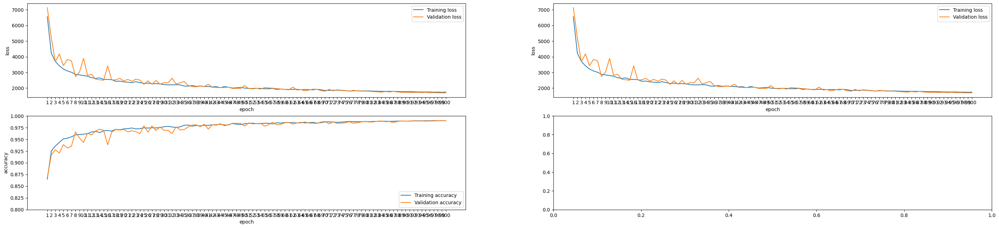

In [10]:
if Model.train_model:
    plot_losses = ["loss", "loss"]
    plot_metrics = ["accuracy", "f1", "recall", "precision"]

    path = os.path.join(Model.Data.paths["FIGURES"], "training")

    plots.plot_training_history(history=history.history, list_of_loss_names=plot_losses,
                                list_of_metric_names=plot_metrics,
                                save=Model.cfg["SAVE"], path=path)

1/1 [==============================] - 0s 20ms/step


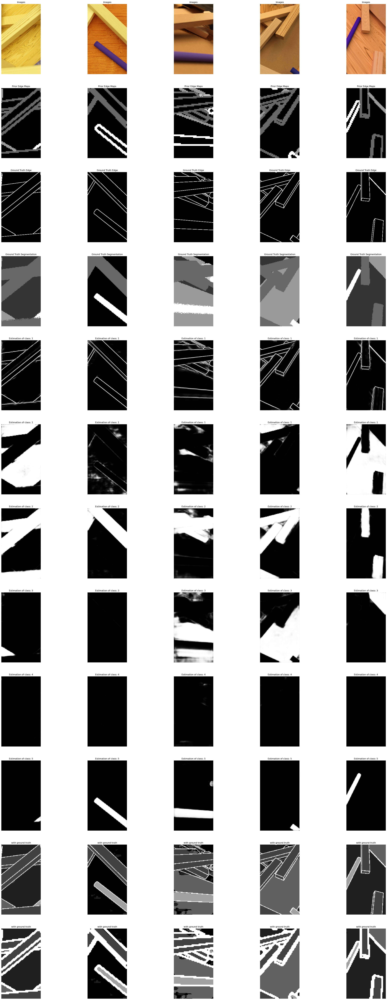

1/1 [==============================] - 0s 21ms/step


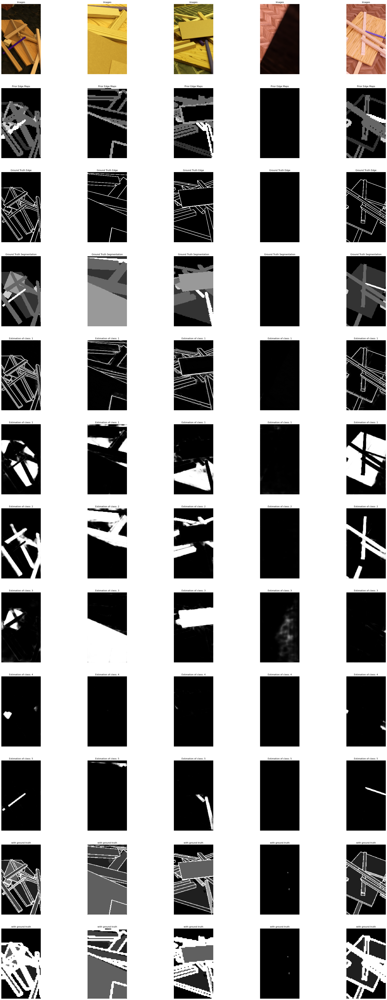

1/1 [==============================] - 0s 20ms/step


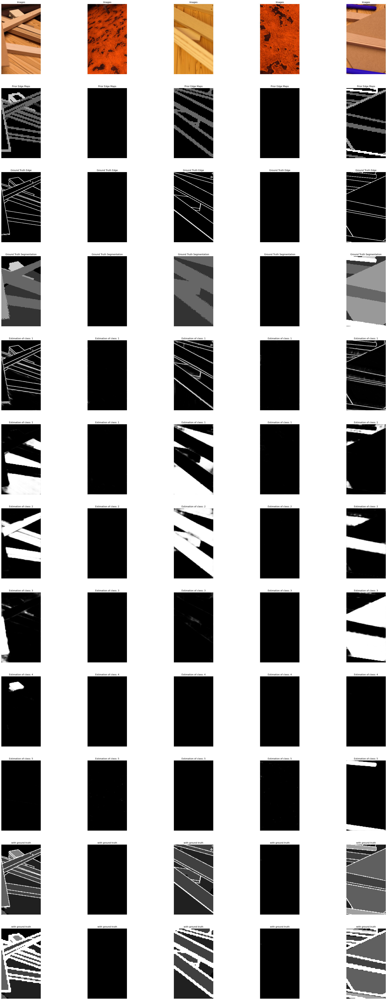

In [13]:
i = 0
for inp, out in test_ds.take(3):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    labels_segmentation=out['out_segmentation'],
                                    labels_edge=out['out_edge'],
                                    predictions_edge=pred[0],
                                    predictions_segmentation=pred[1],
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'])
    i += 1

1/1 [==============================] - 0s 19ms/step


TypeError: unsupported operand type(s) for *: 'NoneType' and 'int'

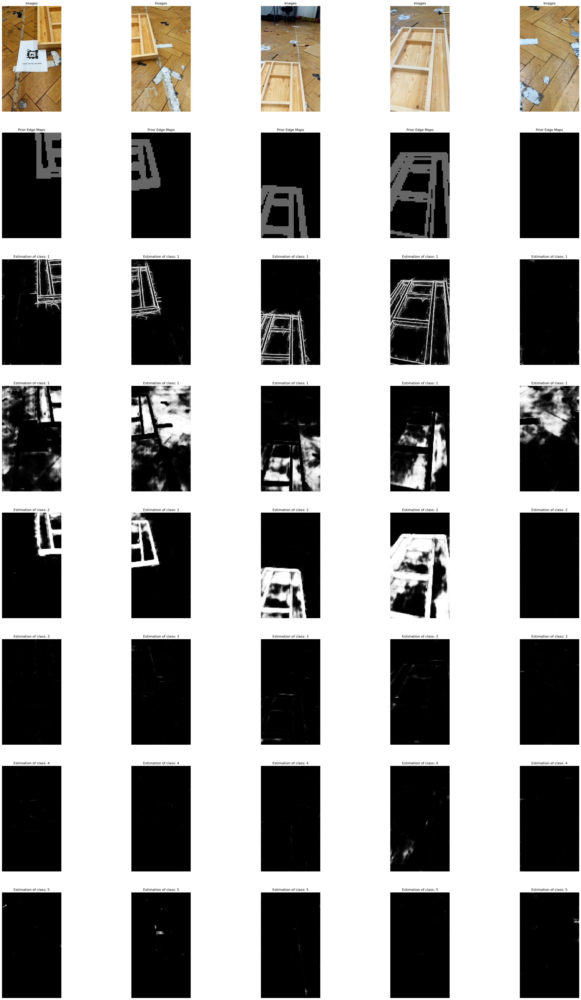

In [12]:
i = 0
for inp, out in img_only_ds.take(1):
    pred = model.predict(inp)
    path = os.path.join(Model.Data.paths["FIGURES"], "prediction_{}".format(i))
    edge_detection_plots.plot_edges(images=inp['in_img'],
                                    prior = inp['in_edge'],
                                    predictions_edge=pred[0],
                                    predictions_segmentation=pred[1],
                                    batch_size=DataProcessing.cfg['TEST']['BATCH_SIZE'],
                                   save=Model.cfg["SAVE"], path=path)
    i += 1

1/1 [==============================] - 0s 19ms/step


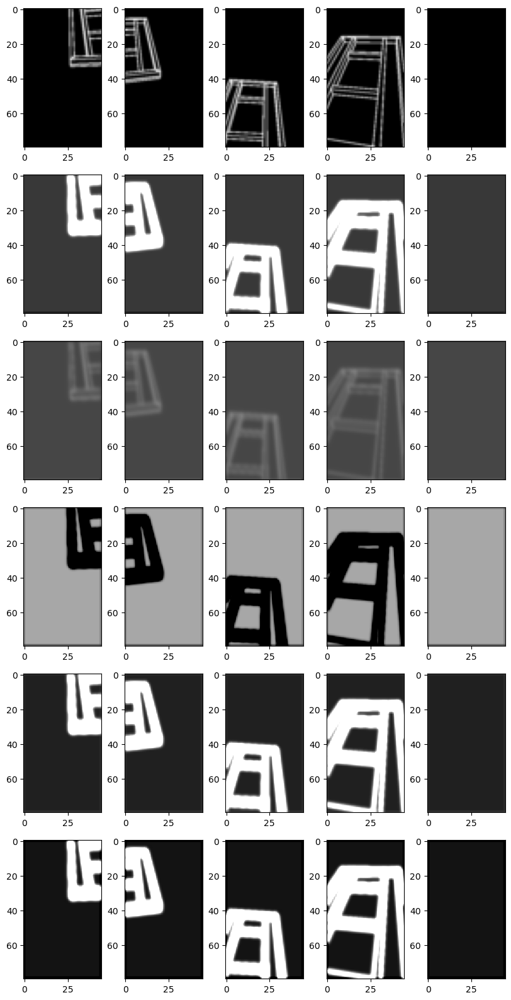

1/1 [==============================] - 0s 85ms/step


2023-01-01 02:22:22.643583: W tensorflow/core/framework/op_kernel.cc:1780] OP_REQUIRES failed at strided_slice_op.cc:105 : INVALID_ARGUMENT: slice index 4 of dimension 0 out of bounds.


InvalidArgumentError: {{function_node __wrapped__StridedSlice_device_/job:localhost/replica:0/task:0/device:GPU:0}} slice index 4 of dimension 0 out of bounds. [Op:StridedSlice] name: strided_slice/

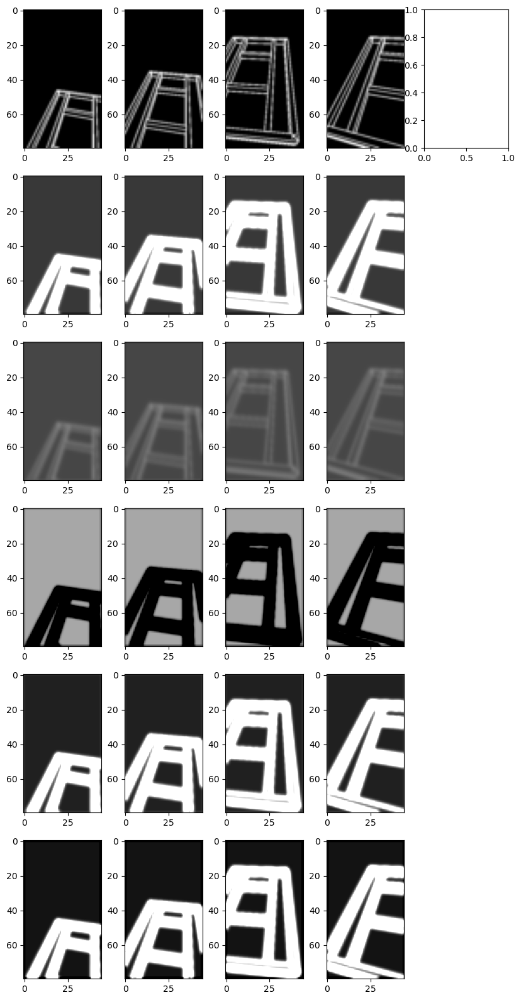

In [14]:
k = 0
output =7 # pyramid_out
num = 5
batch = 5
for inp, out in img_only_ds.take(2):
    plt.figure(figsize=(10,20))
    pred = model.predict(inp)
    out_pred = pred[output]
    for i in range(batch):
        plt.subplot(num+1, batch, i + 1)
        x = inp["in_edge"][i,:,:,1]
        # x = tf.where(x>0.3, 1.0, 0.0)
        plt.imshow(x, cmap='gray', vmin=0, vmax=1)
        for j in range(num):
            plt.subplot(num+1, batch, batch*(1+j) + i + 1)
            plt.imshow(out_pred[i,:,:,j], cmap='gray', vmin=-1, vmax=1)
    path = os.path.join(Model.Data.paths["FIGURES"], "pyramid_out_{}".format(k))
    plt.savefig(path + ".svg", bbox_inches='tight')
    plt.show()
    k = k+1

In [ ]:
k = 0
output = 3 # edge_layer
num = 6
batch = 5
for inp, out in test_ds.take(2):
    plt.figure(figsize=(5,10))
    pred = model.predict(inp)
    out_pred = pred[output]
    for i in range(batch):
        plt.subplot(num+1, batch, i + 1)
        plt.imshow((out["out_edge"][i,:,:,0]))
        for j in range(num):
            plt.subplot(num+1, batch, batch*(1+j) + i + 1)
            plt.imshow(out_pred[i,:,:,j], cmap='gray', vmin=0, vmax=1)
    path = os.path.join(Model.Data.paths["FIGURES"], "side_1_{}".format(k))
    plt.savefig(path + ".svg", bbox_inches='tight')
    plt.show()
    k += 1

In [ ]:
k = 0
output = 2 # image_pyramid_in
num = 12
batch = 5
for inp, out in test_ds.take(2):
    plt.figure(figsize=(5,10))
    pred = model.predict(inp)
    out_pred = pred[output]
    for i in range(batch):
        plt.subplot(num+1, batch, i + 1)
        plt.imshow((out["out_edge"][i,:,:,0]))
        for j in range(num):
            plt.subplot(num+1, batch, batch*(1+j) + i + 1)
            plt.imshow(out_pred[i,:,:,j], cmap='gray', vmin=-1, vmax=1)
    path = os.path.join(Model.Data.paths["FIGURES"], "side_2_{}".format(k))
    plt.savefig(path + ".svg", bbox_inches='tight')
    plt.show()
    k += 1

In [ ]:
### Maximum F1 Score:
path_metrics_evaluation_plot = os.path.join(Model.Data.paths["FIGURES"],
                                            "threshold_metrics_evaluation_test_ds.svg")

edge_detection_plots.plot_threshold_metrics_evaluation(model=model, ds=test_ds,
                                                       num_classes=DataProcessing
                                                       .output_data_cfg["edge"]["num_classes"],
                                                       classes_displayed_individually=True,
                                                       save=Model.cfg["SAVE"],
                                                       path=path_metrics_evaluation_plot,
                                                       accuracy_y_lim_min=0.8)


In [ ]:
if Model.cfg["CONVERT_TO_TFLITE"]:
    Model.convert_model_to_tflite(model)

In [ ]:
for inp, out in test_ds.take(1):
    x = tf.image.rgb_to_hsv((inp["in_img"]+1)*127.5)
    plt.imshow(x[0,:,:,2])
    